<a href="https://colab.research.google.com/github/Theoph-ay/pytorch_tutorials/blob/main/06_Transfer_Learning__Exercise.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
import torchvision
print(torch.__version__)
print(torchvision.__version__)

2.9.0+cu128
0.24.0+cu128


In [2]:
#For this notebook to run with updated APIs, we need torch 1.12+ and torchvision 0.13+
#Current versions of torch and torch visions can run that, so no need for this line of code.
# try:
#     import torch
#     import torchvision
#     assert int(torch.__version__.split(".")[1]) >= 12, "torch version should be 1.12+"
#     assert int(torchvision.__version__.split(".")[1]) >= 13, "torchvision version should be 0.13+"
#     print(f"torch version: {torch.__version__}")
#     print(f"torchvision version: {torchvision.__version__}")
# except:
#     print(f"[INFO] torch/torchvision versions not as required, installing nightly versions.")
#     !pip3 install -U torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu113
#     import torch
#     import torchvision
#     print(f"torch version: {torch.__version__}")
#     print(f"torchvision version: {torchvision.__version__}")

In [3]:
# Continue with regular imports
import matplotlib.pyplot as plt
import torch
import torchvision

from torch import nn
from torchvision import transforms

# Try to get torchinfo, install it if it doesn't work
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

# Try to import the going_modular directory, download it from GitHub if it doesn't work
try:
    from going_modular.going_modular import data_setup, engine
except:
    # Get the going_modular scripts
    print("[INFO] Couldn't find going_modular scripts... downloading them from GitHub.")
    !git clone https://github.com/mrdbourke/pytorch-deep-learning
    !mv pytorch-deep-learning/going_modular .
    !rm -rf pytorch-deep-learning
    from going_modular.going_modular import data_setup, engine

[INFO] Couldn't find torchinfo... installing it.
[INFO] Couldn't find going_modular scripts... downloading them from GitHub.
Cloning into 'pytorch-deep-learning'...
remote: Enumerating objects: 4410, done.
remote: Counting objects: 100% (17/17), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 4410 (delta 5), reused 0 (delta 0), pack-reused 4393 (from 1)
Receiving objects: 100% (4410/4410), 764.18 MiB | 40.62 MiB/s, done.
Resolving deltas: 100% (2661/2661), done.
Updating files: 100% (248/248), done.


In [4]:
# Setup device agnostic code
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [5]:
import os
import zipfile

from pathlib import Path

import requests

# Setup path to data folder
data_path = Path("data/")
image_path = data_path / "pizza_steak_sushi"

# If the image folder doesn't exist, download it and prepare it...
if image_path.is_dir():
    print(f"{image_path} directory exists.")
else:
    print(f"Did not find {image_path} directory, creating one...")
    image_path.mkdir(parents=True, exist_ok=True)

    # Download pizza, steak, sushi data
    with open(data_path / "pizza_steak_sushi.zip", "wb") as f:
        request = requests.get("https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip")
        print("Downloading pizza, steak, sushi data...")
        f.write(request.content)

    # Unzip pizza, steak, sushi data
    with zipfile.ZipFile(data_path / "pizza_steak_sushi.zip", "r") as zip_ref:
        print("Unzipping pizza, steak, sushi data...")
        zip_ref.extractall(image_path)

    # Remove .zip file
    os.remove(data_path / "pizza_steak_sushi.zip")

Did not find data/pizza_steak_sushi directory, creating one...
Unzipping pizza, steak, sushi data...


In [6]:
# Setup Dirs
train_dir = image_path / "train"
test_dir = image_path / "test"

In [7]:
# Create a transforms pipeline manually (required for torchvision < 0.13)
manual_transforms = transforms.Compose([
    transforms.Resize((224, 224)), # 1. Reshape all images to 224x224 (though some models may require different sizes)
    transforms.ToTensor(), # 2. Turn image values to between 0 & 1
    transforms.Normalize(mean=[0.485, 0.456, 0.406], # 3. A mean of [0.485, 0.456, 0.406] (across each colour channel)
                         std=[0.229, 0.224, 0.225]) # 4. A standard deviation of [0.229, 0.224, 0.225] (across each colour channel),
])

In [8]:
# Create training and testing DataLoaders as well as get a list of class names
train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(train_dir=train_dir,
                                                                               test_dir=test_dir,
                                                                               transform=manual_transforms, # resize, convert images to between 0 & 1 and normalize them
                                                                               batch_size=32) # set mini-batch size to 32

train_dataloader, test_dataloader, class_names

(<torch.utils.data.dataloader.DataLoader at 0x7cb49f5edcd0>,
 ['pizza', 'steak', 'sushi'])

In [9]:
# Get a set of pretrained model weights
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT # .DEFAULT = best available weights from pretraining on ImageNet
weights

EfficientNet_B0_Weights.IMAGENET1K_V1

In [10]:
# Get the transforms used to create our pretrained weights
auto_transforms = weights.transforms()
auto_transforms

ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)

In [11]:
# Create training and testing DataLoaders as well as get a list of class names
train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(train_dir=train_dir,
                                                                               test_dir=test_dir,
                                                                               transform=auto_transforms, # perform same data transforms on our own data as the pretrained model
                                                                               batch_size=32) # set mini-batch size to 32

train_dataloader, test_dataloader, class_names

(<torch.utils.data.dataloader.DataLoader at 0x7cb49f5ef800>,
 ['pizza', 'steak', 'sushi'])

In [12]:
# OLD: Setup the model with pretrained weights and send it to the target device (this was prior to torchvision v0.13)
# model = torchvision.models.efficientnet_b0(pretrained=True).to(device) # OLD method (with pretrained=True)

# NEW: Setup the model with pretrained weights and send it to the target device (torchvision v0.13+)
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT # .DEFAULT = best available weights
model = torchvision.models.efficientnet_b0(weights=weights).to(device)

#model

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 133MB/s] 


In [13]:
# Print a summary using torchinfo (uncomment for actual output)
summary(model=model,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 1000]           --                   True
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   True
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   True
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   864                  True
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   64                   True
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 16, 112

In [14]:
# Freeze all base layers in the "features" section of the model (the feature extractor) by setting requires_grad=False
for param in model.features.parameters():
    param.requires_grad = False

In [15]:
# Set the manual seeds
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# Get the length of class_names (one output unit for each class)
output_shape = len(class_names)

# Recreate the classifier layer and seed it to the target device
model.classifier = torch.nn.Sequential(
    torch.nn.Dropout(p=0.2, inplace=True),
    torch.nn.Linear(in_features=1280,
                    out_features=output_shape, # same number of output units as our number of classes
                    bias=True)).to(device)

In [16]:
# # Do a summary *after* freezing the features and changing the output classifier layer (uncomment for actual output)
summary(model,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape" (batch_size, color_channels, height, width)
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

In [17]:
# Define loss and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [18]:
# Set the random seeds
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# Start the timer
from timeit import default_timer as timer
start_time = timer()

# Setup training and save the results
results = engine.train(model=model,
                       train_dataloader=train_dataloader,
                       test_dataloader=test_dataloader,
                       optimizer=optimizer,
                       loss_fn=loss_fn,
                       epochs=5,
                       device=device)

# End the timer and print out how long it took
end_time = timer()
print(f"[INFO] Total training time: {end_time-start_time:.3f} seconds")

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0924 | train_acc: 0.3984 | test_loss: 0.9133 | test_acc: 0.5398
Epoch: 2 | train_loss: 0.8717 | train_acc: 0.7773 | test_loss: 0.7912 | test_acc: 0.8153
Epoch: 3 | train_loss: 0.7648 | train_acc: 0.7930 | test_loss: 0.7463 | test_acc: 0.8561
Epoch: 4 | train_loss: 0.7109 | train_acc: 0.7539 | test_loss: 0.6373 | test_acc: 0.8655
Epoch: 5 | train_loss: 0.6255 | train_acc: 0.7852 | test_loss: 0.6261 | test_acc: 0.8561
[INFO] Total training time: 21.471 seconds


[INFO] Couldn't find helper_functions.py, downloading...


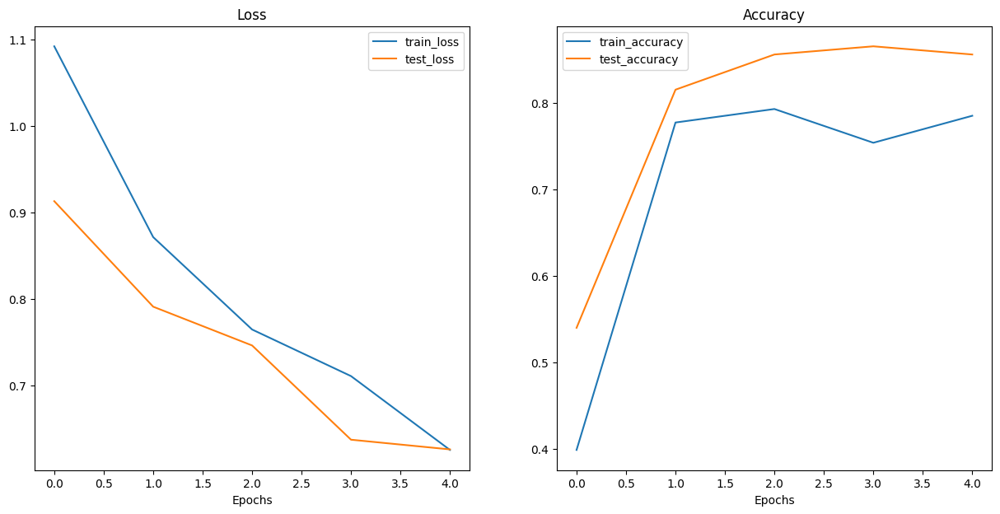

In [19]:
# Get the plot_loss_curves() function from helper_functions.py, download the file if we don't have it
try:
    from helper_functions import plot_loss_curves
except:
    print("[INFO] Couldn't find helper_functions.py, downloading...")
    with open("helper_functions.py", "wb") as f:
        import requests
        request = requests.get("https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/helper_functions.py")
        f.write(request.content)
    from helper_functions import plot_loss_curves

# Plot the loss curves of our model
plot_loss_curves(results)

In [20]:
from typing import List, Tuple

from PIL import Image

# 1. Take in a trained model, class names, image path, image size, a transform and target device
def pred_and_plot_image(model: torch.nn.Module,
                        image_path: str,
                        class_names: List[str],
                        image_size: Tuple[int, int] = (224, 224),
                        transform: torchvision.transforms = None,
                        device: torch.device=device):


    # 2. Open image
    img = Image.open(image_path)

    # 3. Create transformation for image (if one doesn't exist)
    if transform is not None:
        image_transform = transform
    else:
        image_transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225]),
        ])

    ### Predict on image ###

    # 4. Make sure the model is on the target device
    model.to(device)

    # 5. Turn on model evaluation mode and inference mode
    model.eval()
    with torch.inference_mode():
      # 6. Transform and add an extra dimension to image (model requires samples in [batch_size, color_channels, height, width])
      transformed_image = image_transform(img).unsqueeze(dim=0)

      # 7. Make a prediction on image with an extra dimension and send it to the target device
      target_image_pred = model(transformed_image.to(device))

    # 8. Convert logits -> prediction probabilities (using torch.softmax() for multi-class classification)
    target_image_pred_probs = torch.softmax(target_image_pred, dim=1)

    # 9. Convert prediction probabilities -> prediction labels
    target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)

    # 10. Plot image with predicted label and probability
    plt.figure()
    plt.imshow(img)
    plt.title(f"Pred: {class_names[target_image_pred_label]} | Prob: {target_image_pred_probs.max():.3f}")
    plt.axis(False);

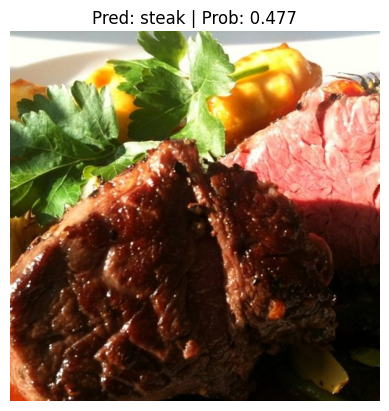

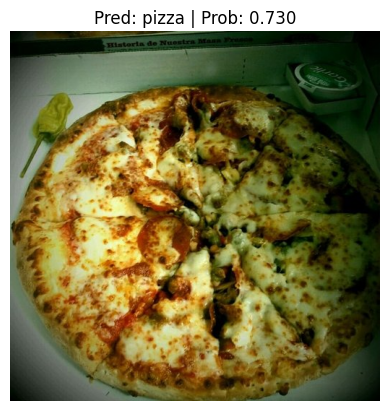

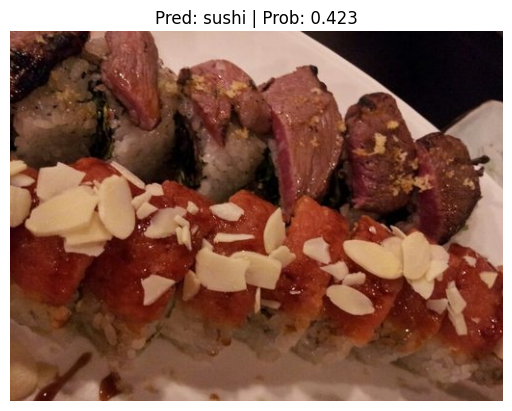

In [21]:
# Get a random list of image paths from test set
import random
num_images_to_plot = 3
test_image_path_list = list(Path(test_dir).glob("*/*.jpg")) # get list all image paths from test data
test_image_path_sample = random.sample(population=test_image_path_list, # go through all of the test image paths
                                       k=num_images_to_plot) # randomly select 'k' image paths to pred and plot

# Make predictions on and plot the images
for image_path in test_image_path_sample:
    pred_and_plot_image(model=model,
                        image_path=image_path,
                        class_names=class_names,
                        # transform=weights.transforms(), # optionally pass in a specified transform from our pretrained model weights
                        image_size=(224, 224))

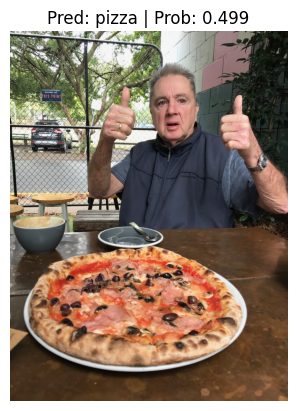

In [22]:
# Download custom image
import requests

# Setup custom image path
custom_image_path = data_path / "04-pizza-dad.jpeg"

# Download the image if it doesn't already exist
if not custom_image_path.is_file():
    with open(custom_image_path, "wb") as f:
        # When downloading from GitHub, need to use the "raw" file link
        request = requests.get("https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/images/04-pizza-dad.jpeg")
        print(f"Downloading {custom_image_path}...")
        f.write(request.content)
else:
    print(f"{custom_image_path} already exists, skipping download.")

# Predict on custom image
pred_and_plot_image(model=model,
                    image_path=custom_image_path,
                    class_names=class_names)

#Predict on the Test Data

In [23]:
#predict on the test data
test_preds = []
y_true =[]
model.eval()
with torch.inference_mode():
  for X, y in test_dataloader:
    X, y = X.to(device), y.to(device)
    test_logits = model(X)
    test_pred = torch.argmax(torch.softmax(test_logits, dim=1), dim=1)
    test_preds.append(test_pred)
    y_true.append(y)
test_preds_T = torch.cat(test_preds)
y = torch.cat(y_true)

In [24]:
len(test_dataloader.dataset), len(test_preds_T), len(y)

(75, 75, 75)

In [25]:
y[:5], test_preds_T[:5]

(tensor([0, 0, 0, 0, 0], device='cuda:0'),
 tensor([0, 0, 0, 0, 0], device='cuda:0'))

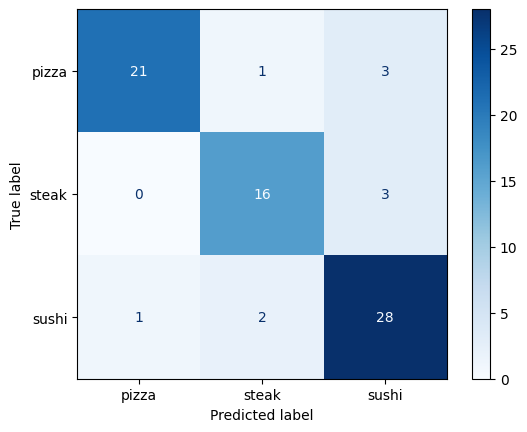

In [26]:
#I am using sklearn to avoid mlxtend and torchmetrics installation issues
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y.cpu().numpy(), test_preds_T.cpu().numpy())

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.show()

# I want to use `torchmetrics` for the confusion matrix display

sklearn wouldn't allow GPU go brrrrrrr

In [27]:
#Import torchmetrics
try:
  from torchmetrics.classification import MulticlassConfusionMatrix

except:
  print("[INFO] Couldn't find torchmetrics, installing it...")
  !pip install -q torchmetrics
  from torchmetrics.classification import MulticlassConfusionMatrix
print("torchmetrics.classification MulticlassConfusionMatrix imported")

[INFO] Couldn't find torchmetrics, installing it...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 16.5 MB/s eta 0:00:00
torchmetrics.classification MulticlassConfusionMatrix imported


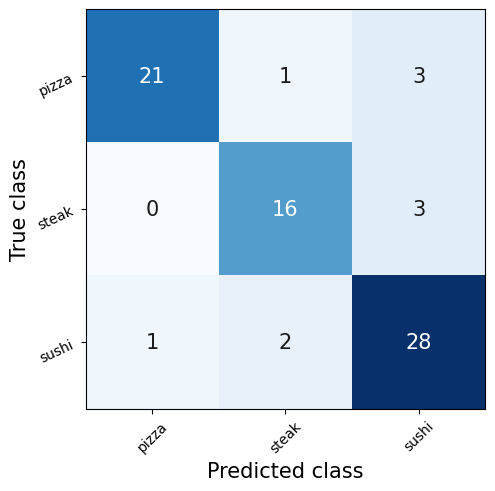

In [28]:
#Set up confusion matrix, update and display
confmat = MulticlassConfusionMatrix(num_classes = len(class_names)).to(device)
confmat(test_preds_T, y)
confmat.plot(cmap=plt.cm.Blues, labels=class_names)
plt.show()

#Plotting the most wrong predictions

In [29]:
#predict on the test data
test_preds = []
test_proba = []
y_true =[]
model.eval()
with torch.inference_mode():
  for X, y in test_dataloader:
    X, y = X.to(device), y.to(device)
    test_logits = model(X)
    test_pred_proba = torch.softmax(test_logits, dim=1)
    test_pred = torch.argmax(test_logits, dim=1)  #Can also use test_pred_proba here too
    test_preds.append(test_pred)
    test_proba.append(test_pred_proba)
    y_true.append(y)
test_preds_T = torch.cat(test_preds)
y = torch.cat(y_true)
test_proba_T = torch.cat(test_proba)

In [30]:
#get wrong predictions and print the length
y_pred_wrong = test_preds_T != y

print(f"Number of wrong predictions: {y_pred_wrong.sum()}")

Number of wrong predictions: 10


In [31]:
# Get the indices of wrong predictions
wrong_preds_indices = torch.nonzero(y_pred_wrong).squeeze()

wrong_preds_indices

tensor([12, 13, 15, 16, 27, 34, 38, 58, 64, 70], device='cuda:0')

Indices of wrong predictions sorted by predicted probability (most confident first):
tensor([12, 13, 27, 16, 70, 64, 15, 58, 38, 34], device='cuda:0')


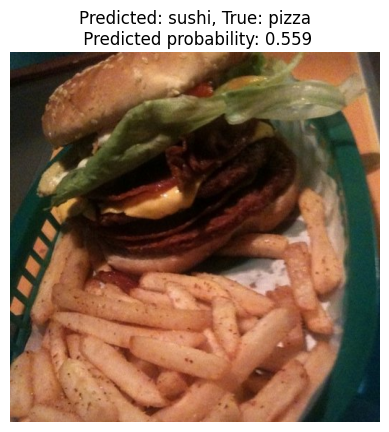

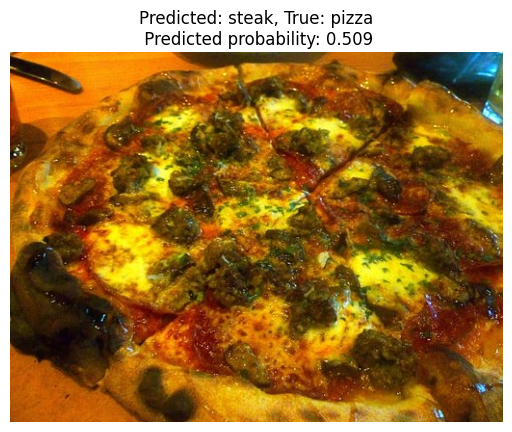

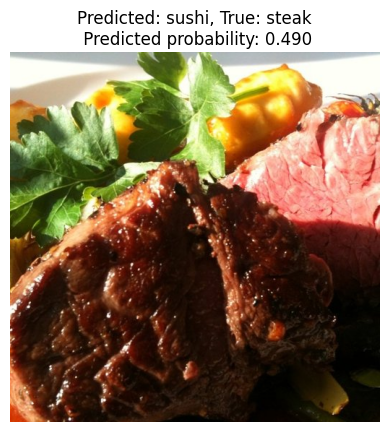

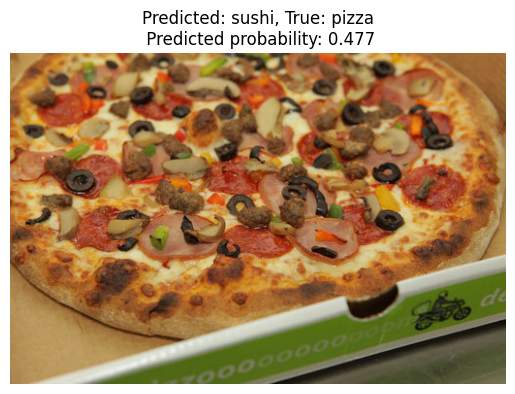

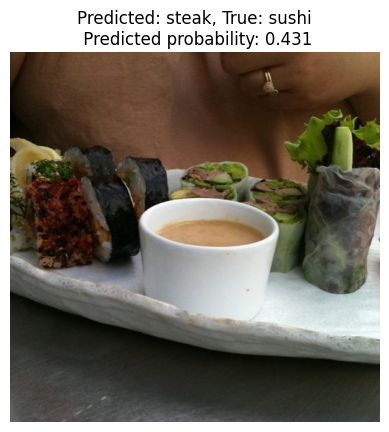

In [32]:
#Plot image
import matplotlib.pyplot as plt
from PIL import Image

# Get the probabilities of the predicted (wrong) class for the wrong predictions
wrong_predicted_class_probs = test_proba_T[wrong_preds_indices, test_preds_T[wrong_preds_indices]]

# Sort the wrong predictions by their predicted class probability (most confident first)
# `sorted_prob_values` contains the probabilities themselves, sorted in descending order.
# `indices_to_sort_probs` contains the indices that would sort `wrong_predicted_class_probs`,
# allowing us to reorder `wrong_preds_indices` accordingly.
sorted_prob_values, indices_to_sort_probs = torch.sort(wrong_predicted_class_probs, descending=True)

# Now, apply these `indices_to_sort_probs` to reorder the original `wrong_preds_indices`.
# This gives us the actual dataset indices of the wrong predictions, sorted by their confidence.
sorted_wrong_preds_dataset_indices = wrong_preds_indices[indices_to_sort_probs]

print("Indices of wrong predictions sorted by predicted probability (most confident first):")
print(sorted_wrong_preds_dataset_indices)

# Extract the top 5 actual dataset indices and their corresponding probabilities
top_5_wrong_images_dataset_indices = sorted_wrong_preds_dataset_indices[:5]
top_5_wrong_predicted_probs = sorted_prob_values[:5]

# Loop through the top 5 wrong predictions for plotting
for i in range(len(top_5_wrong_images_dataset_indices)):
    idx_in_dataset = top_5_wrong_images_dataset_indices[i] # Get the actual dataset index
    prob_for_display = top_5_wrong_predicted_probs[i] # Get the corresponding probability

    # Get the image path using the actual dataset index
    image_info = test_dataloader.dataset.samples[idx_in_dataset] # Gets a (path, label) tuple
    actual_image_path = image_info[0] # Extract the image path

    image = Image.open(actual_image_path)
    plt.imshow(image)
    # Use idx_in_dataset to get true/predicted labels, and prob_for_display for the probability
    plt.title(f"Predicted: {class_names[test_preds_T[idx_in_dataset]]}, True: {class_names[y[idx_in_dataset]]}\n Predicted probability: {prob_for_display:.3f}")
    plt.axis(False)
    plt.show()

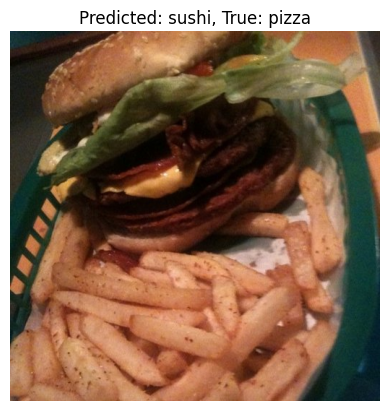

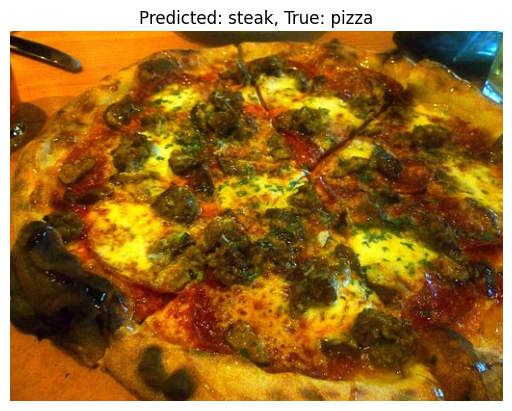

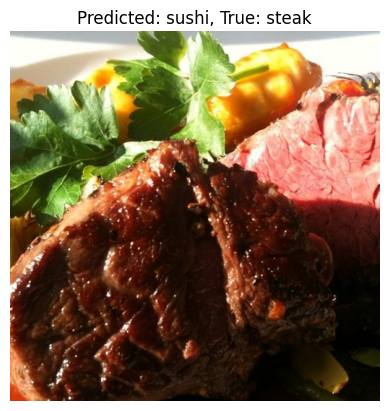

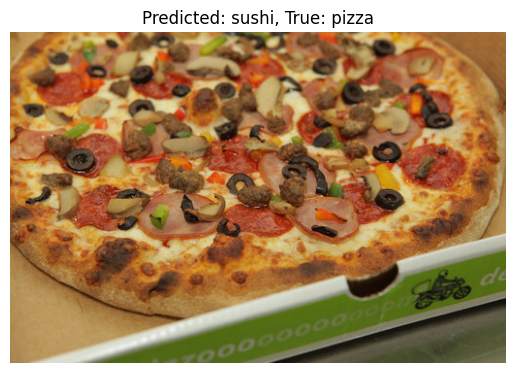

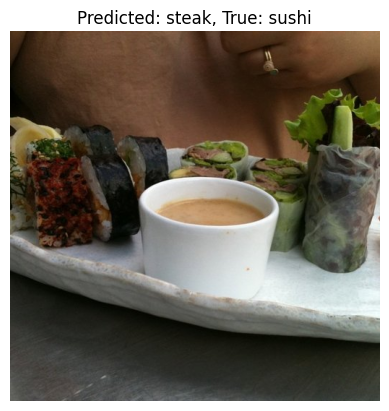

In [33]:
#Plot image
import matplotlib.pyplot as plt
from PIL import Image

top_5_wrong_images = sorted_wrong_preds_dataset_indices[:5]

for idx in top_5_wrong_images:
    image_info = test_dataloader.dataset.samples[idx] # Get the specific (path, label) tuple
    actual_image_path = image_info[0] # Extract the image path (first element of the tuple)

    image = Image.open(actual_image_path)
    plt.imshow(image)
    plt.title(f"Predicted: {class_names[test_preds_T[idx]]}, True: {class_names[y[idx]]}")
    plt.axis(False)
    plt.show()

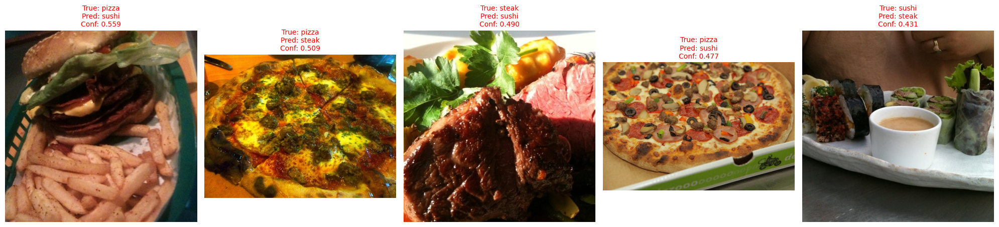

In [34]:
import matplotlib.pyplot as plt
from PIL import Image

# 1. Gather all mistakes into a clean list of dictionaries
wrong_indices = torch.where(test_preds_T != y)[0]
mistakes = []

for idx in wrong_indices:
    mistakes.append({
        "true_label": class_names[y[idx]],
        "pred_label": class_names[test_preds_T[idx]],
        "confidence": test_proba_T[idx][test_preds_T[idx]].item(),
        "image_path": test_dataloader.dataset.samples[idx][0]
    })

# 2. Sort: Highest confidence in the wrong answer first
mistakes.sort(key=lambda x: x["confidence"], reverse=True)

# 3. Create a "canvas" with 1 row and 5 columns
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 6))

for i in range(5):
    m = mistakes[i]
    img = Image.open(m["image_path"])

    # Use the i-th subplot "axis"
    axes[i].imshow(img)
    axes[i].set_title(f"True: {m['true_label']}\nPred: {m['pred_label']}\nConf: {m['confidence']:.3f}",
                      fontsize=10,
                      color="red" if m['true_label'] != m['pred_label'] else "black")
    axes[i].axis(False)

plt.tight_layout()
plt.show()

# Why did the model get some of these wrong?

some of the images have wrong labels while some do not even beling to any of the three classes in my opinion

#Predict on personal image

In [35]:
custom_image_path = data_path / "pizza.jpeg"

if custom_image_path.is_file():
  print(f"{custom_image_path} already exists, skipping download.")
else:
  print(f"{custom_image_path} doesn't exists, starting download.")

  with open(custom_image_path, "wb") as f:
    request = requests.get("https://media.istockphoto.com/id/496546118/photo/slice-of-fresh-italian-classic-original-pepperoni-pizza-isolated.jpg?s=1024x1024&w=is&k=20&c=qIy40Hkahr6RMI2FNaVg81K6ON0iBCFDNPf58Gr1qUY=")
    f.write(request.content)
    print(f"{custom_image_path} now downloaded.")

data/pizza.jpeg doesn't exists, starting download.
data/pizza.jpeg now downloaded.


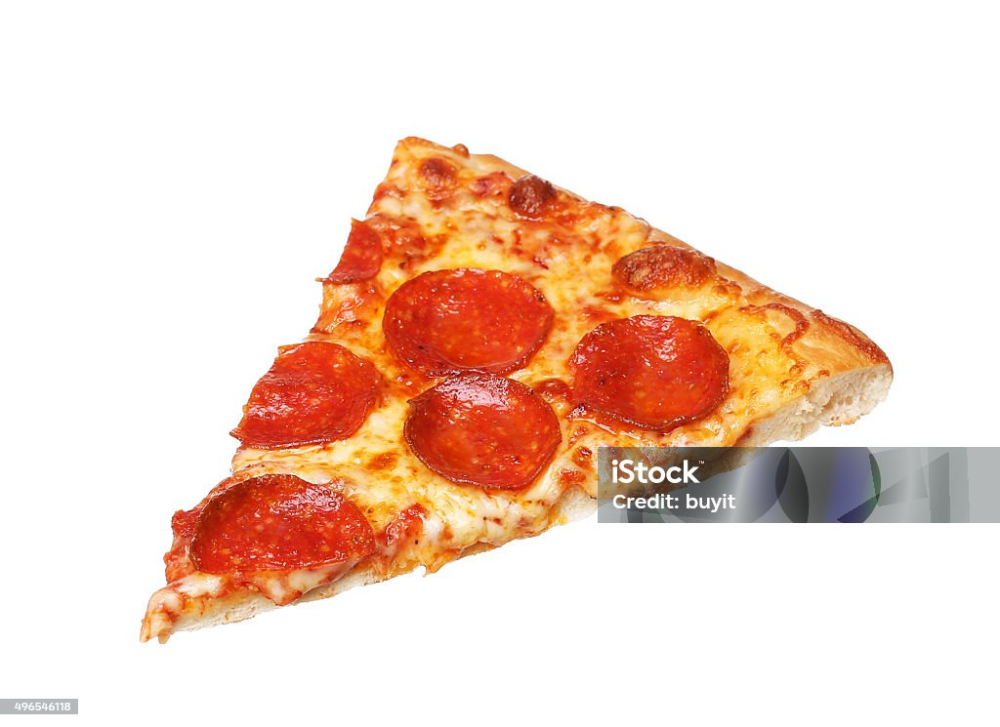

In [36]:
Image.open(custom_image_path)

In [37]:
custom_image = auto_transforms(Image.open(custom_image_path))
custom_image.shape

torch.Size([3, 224, 224])

In [38]:
#predict
model.eval()
with torch.inference_mode():
  custom_logits = model(custom_image.unsqueeze(dim=0).to(device))
  custom_pred_proba = torch.softmax(custom_logits, dim=1)
  custom_pred = torch.argmax(custom_logits, dim=1)

print(f"Predicted class: {class_names[custom_pred]}")
print(f"Predicted probability: {custom_pred_proba[0][custom_pred]}")

Predicted class: steak
Predicted probability: tensor([0.3677], device='cuda:0')


In [39]:
#predict on another custom pizza image

custom_image_path2 = data_path/"pizza2.jpeg"

with open(custom_image_path2, "wb") as f:
  request = requests.get("https://media.istockphoto.com/id/1413684626/photo/classic-pepperoni-pizza-with-cut-slices-isolated-on-white.jpg?s=1024x1024&w=is&k=20&c=YYrLl6_MKT_FHSwk31Wwsxz4xafWCspAUcLJDjz_mu8=")
  f.write(request.content)
print(f"{custom_image_path2} downloaded..")

data/pizza2.jpeg downloaded..


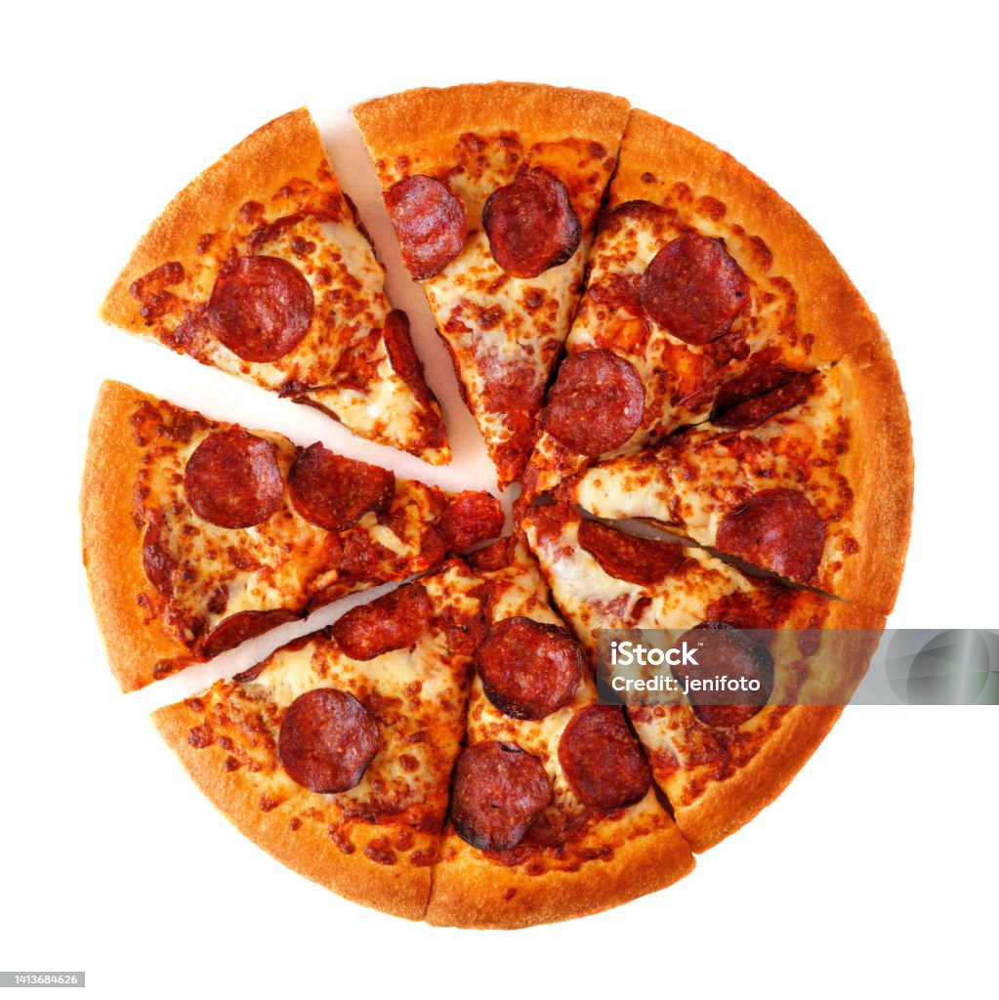

In [40]:
image = Image.open(custom_image_path2)
image

In [41]:
#Transform image and predict
custom_image = auto_transforms(image)

model.eval()
with torch.inference_mode():
  custom_logits2 = model(custom_image.unsqueeze(dim=0).to(device))
  custom_logits2_preds_proba = torch.softmax(custom_logits2, dim=1)
  custom_pred2 = torch.argmax(custom_logits2, dim=1)

print(f"Predicted class: {class_names[custom_pred2]}")
print(f"PRedicted probability: {custom_logits2_preds_proba[0][custom_pred2]}")

Predicted class: pizza
PRedicted probability: tensor([0.6285], device='cuda:0')


In [42]:
# Predict on a goat image
custom_image_path3 = data_path/"goat.jpeg"

with open(custom_image_path3, "wb") as f:
  request = requests.get("https://media.istockphoto.com/id/1414247904/photo/brown-goat-isolated-on-white-background.jpg?s=1024x1024&w=is&k=20&c=cidWFjJ8rzfbnTXbbPm8t_JDoqd5YK4OFUl78Imb9aM=")
  f.write(request.content)

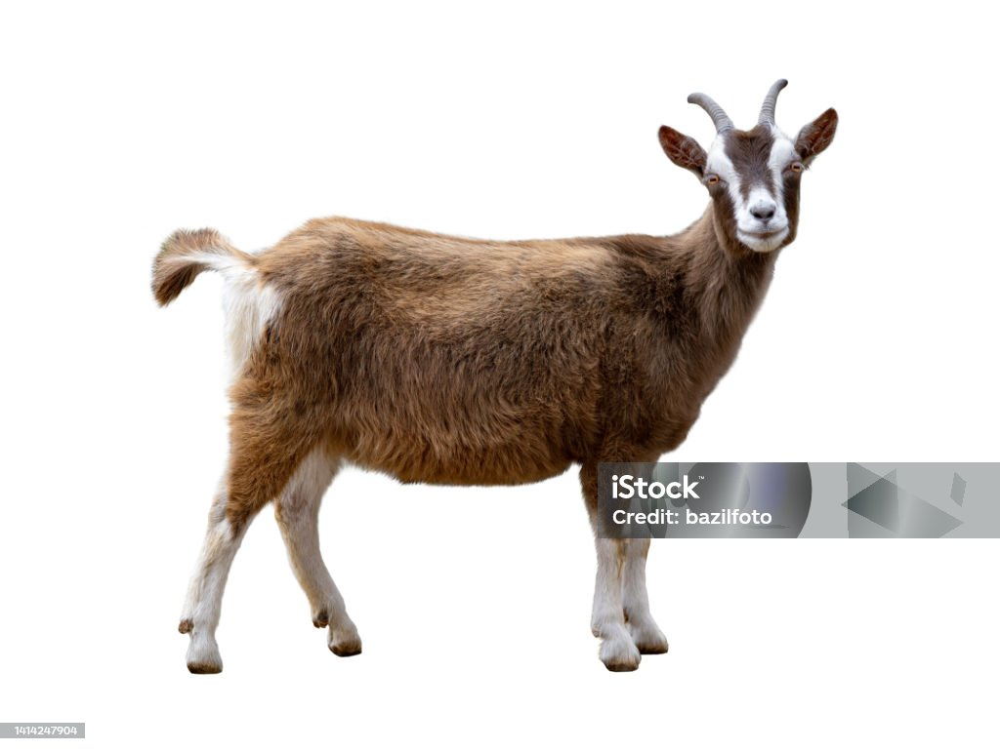

In [43]:
goat_img = Image.open(custom_image_path3)
goat_img

In [44]:
#Transform and predict

goat_image = auto_transforms(goat_img)

model.eval()
with torch.inference_mode():
  custom_logits3 = model(goat_image.unsqueeze(dim=0).to(device))
  custom_logits3_preds_proba = torch.softmax(custom_logits3, dim=1)
  custom_pred3 = torch.argmax(custom_logits3, dim=1)
print(f"Prediction: {class_names[custom_pred3]}")
print(f"Prediction probability: {custom_logits3_preds_proba[0][custom_pred3]}")

Prediction: sushi
Prediction probability: tensor([0.4676], device='cuda:0')


###The model predicted the goat as sushi

#Train model for 10 epochs

In [45]:
# Set the random seeds
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# Start the timer
from timeit import default_timer as timer
start_time = timer()

# Setup training and save the results
results = engine.train(model=model,
                       train_dataloader=train_dataloader,
                       test_dataloader=test_dataloader,
                       optimizer=optimizer,
                       loss_fn=loss_fn,
                       epochs=10,
                       device=device)

# End the timer and print out how long it took
end_time = timer()
print(f"[INFO] Total training time: {end_time-start_time:.3f} seconds")

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.5289 | train_acc: 0.9258 | test_loss: 0.5675 | test_acc: 0.8759
Epoch: 2 | train_loss: 0.4793 | train_acc: 0.9297 | test_loss: 0.5215 | test_acc: 0.8655
Epoch: 3 | train_loss: 0.4518 | train_acc: 0.9219 | test_loss: 0.5251 | test_acc: 0.8551
Epoch: 4 | train_loss: 0.4759 | train_acc: 0.8398 | test_loss: 0.4815 | test_acc: 0.8655
Epoch: 5 | train_loss: 0.4072 | train_acc: 0.9570 | test_loss: 0.4943 | test_acc: 0.8561
Epoch: 6 | train_loss: 0.4402 | train_acc: 0.8203 | test_loss: 0.4729 | test_acc: 0.8864
Epoch: 7 | train_loss: 0.4078 | train_acc: 0.9453 | test_loss: 0.4560 | test_acc: 0.8456
Epoch: 8 | train_loss: 0.4280 | train_acc: 0.8320 | test_loss: 0.4499 | test_acc: 0.8769
Epoch: 9 | train_loss: 0.5003 | train_acc: 0.8242 | test_loss: 0.4426 | test_acc: 0.8352
Epoch: 10 | train_loss: 0.4109 | train_acc: 0.8320 | test_loss: 0.3863 | test_acc: 0.9062
[INFO] Total training time: 33.158 seconds


#### The Accuracy of the model seems to be oscillating between and even dropped below it's max 95.70 to 83.20 for training accuracy.
#### While test accuracy after it's oscillation gets to 90%

# Train model with 20% Data

In [46]:
# Get data
data_20_path = data_path/ "pizza_steak_sushi_20_percent"

with open(data_path / "pizza_steak_sushi_20_percent.zip", "wb") as f:
  request = requests.get("https://github.com/mrdbourke/pytorch-deep-learning/raw/refs/heads/main/data/pizza_steak_sushi_20_percent.zip")
  f.write(request.content)

with zipfile.ZipFile(data_path / "pizza_steak_sushi_20_percent.zip", "r") as zip:
  zip.extractall(data_20_path)

In [47]:
train_20_dir = data_20_path / "train"
test_20_dir = data_20_path / "test"

In [48]:
# Create training and testing DataLoaders as well as get a list of class names
train_20_dataloader, test_20_dataloader, class_names = data_setup.create_dataloaders(train_dir=train_20_dir,
                                                                               test_dir=test_20_dir,
                                                                               transform=auto_transforms, # perform same data transforms on our own data as the pretrained model
                                                                               batch_size=32) # set mini-batch size to 32

train_dataloader, test_dataloader, class_names

(<torch.utils.data.dataloader.DataLoader at 0x7cb49f5ef800>,
 ['pizza', 'steak', 'sushi'])

In [49]:
# Set the random seeds
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# Start the timer
from timeit import default_timer as timer
start_time = timer()

# Setup training and save the results
results = engine.train(model=model,
                       train_dataloader=train_20_dataloader,
                       test_dataloader=test_20_dataloader,
                       optimizer=optimizer,
                       loss_fn=loss_fn,
                       epochs=10,
                       device=device)

# End the timer and print out how long it took
end_time = timer()
print(f"[INFO] Total training time: {end_time-start_time:.3f} seconds")

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.4390 | train_acc: 0.8646 | test_loss: 0.3666 | test_acc: 0.8915
Epoch: 2 | train_loss: 0.3932 | train_acc: 0.8771 | test_loss: 0.3398 | test_acc: 0.9136
Epoch: 3 | train_loss: 0.4402 | train_acc: 0.8292 | test_loss: 0.3143 | test_acc: 0.9102
Epoch: 4 | train_loss: 0.3122 | train_acc: 0.9062 | test_loss: 0.3117 | test_acc: 0.9006
Epoch: 5 | train_loss: 0.3425 | train_acc: 0.9062 | test_loss: 0.3136 | test_acc: 0.9108
Epoch: 6 | train_loss: 0.3671 | train_acc: 0.8979 | test_loss: 0.3007 | test_acc: 0.9102
Epoch: 7 | train_loss: 0.3572 | train_acc: 0.8896 | test_loss: 0.2834 | test_acc: 0.9347
Epoch: 8 | train_loss: 0.3779 | train_acc: 0.8458 | test_loss: 0.3011 | test_acc: 0.8949
Epoch: 9 | train_loss: 0.2942 | train_acc: 0.8958 | test_loss: 0.2788 | test_acc: 0.9011
Epoch: 10 | train_loss: 0.3376 | train_acc: 0.8917 | test_loss: 0.2669 | test_acc: 0.9256
[INFO] Total training time: 44.146 seconds


Accuracy is not really increasing

# USING EFFICIENTNET B2 ON THE DATA

In [50]:
#Get model and model weight
import torchvision.models as models

weight_effnet = models.EfficientNet_B2_Weights.DEFAULT
model_effnet = (models.efficientnet_b2(weights=weight_effnet)).to(device)

Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-c35c1473.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-c35c1473.pth


100%|██████████| 35.2M/35.2M [00:00<00:00, 113MB/s]


In [51]:
#Set transforms
effnet_transforms = weight_effnet.transforms()
effnet_transforms

ImageClassification(
    crop_size=[288]
    resize_size=[288]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)

In [52]:
for params in model_effnet.features.parameters():
  require_grad = False

In [53]:
# Print a summary using torchinfo (uncomment for actual output)
summary(model=model_effnet,
        input_size=(32, 3, 288, 288), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 288, 288]    [32, 1000]           --                   True
├─Sequential (features)                                      [32, 3, 288, 288]    [32, 1408, 9, 9]     --                   True
│    └─Conv2dNormActivation (0)                              [32, 3, 288, 288]    [32, 32, 144, 144]   --                   True
│    │    └─Conv2d (0)                                       [32, 3, 288, 288]    [32, 32, 144, 144]   864                  True
│    │    └─BatchNorm2d (1)                                  [32, 32, 144, 144]   [32, 32, 144, 144]   64                   True
│    │    └─SiLU (2)                                         [32, 32, 144, 144]   [32, 32, 144, 144]   --                   --
│    └─Sequential (1)                                        [32, 32, 144, 144]   [32, 16, 144

In [54]:
model_effnet.classifier = torch.nn.Sequential(
    nn.Dropout(p=0.2, inplace=True),
    nn.Linear(in_features=1408, out_features=3, bias=True)
)

In [55]:
#set optimizer
effnet_optimizer = torch.optim.Adam(params = model_effnet.parameters(), lr=0.01)

In [56]:
# Set the random seeds
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# Start the timer
from timeit import default_timer as timer
start_time = timer()

# Setup training and save the results
results = engine.train(model=model_effnet,
                       train_dataloader=train_20_dataloader,
                       test_dataloader=test_20_dataloader,
                       optimizer=effnet_optimizer,
                       loss_fn=loss_fn,
                       epochs=10,
                       device=device)

# End the timer and print out how long it took
end_time = timer()
print(f"[INFO] Total training time: {end_time-start_time:.3f} seconds")

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.4560 | train_acc: 0.5188 | test_loss: 30237.8102 | test_acc: 0.3500
Epoch: 2 | train_loss: 1.1148 | train_acc: 0.5771 | test_loss: 880.5602 | test_acc: 0.3438
Epoch: 3 | train_loss: 1.2014 | train_acc: 0.5250 | test_loss: 23.8115 | test_acc: 0.3500
Epoch: 4 | train_loss: 1.0364 | train_acc: 0.5687 | test_loss: 1.4833 | test_acc: 0.5381
Epoch: 5 | train_loss: 0.8000 | train_acc: 0.7063 | test_loss: 0.9187 | test_acc: 0.5795
Epoch: 6 | train_loss: 0.7586 | train_acc: 0.7271 | test_loss: 2.0185 | test_acc: 0.3705
Epoch: 7 | train_loss: 0.8193 | train_acc: 0.6833 | test_loss: 1.0428 | test_acc: 0.5000
Epoch: 8 | train_loss: 0.8312 | train_acc: 0.6917 | test_loss: 1.5379 | test_acc: 0.5915
Epoch: 9 | train_loss: 0.6551 | train_acc: 0.7333 | test_loss: 0.7678 | test_acc: 0.7040
Epoch: 10 | train_loss: 0.6869 | train_acc: 0.7667 | test_loss: 1.2893 | test_acc: 0.5602
[INFO] Total training time: 61.610 seconds


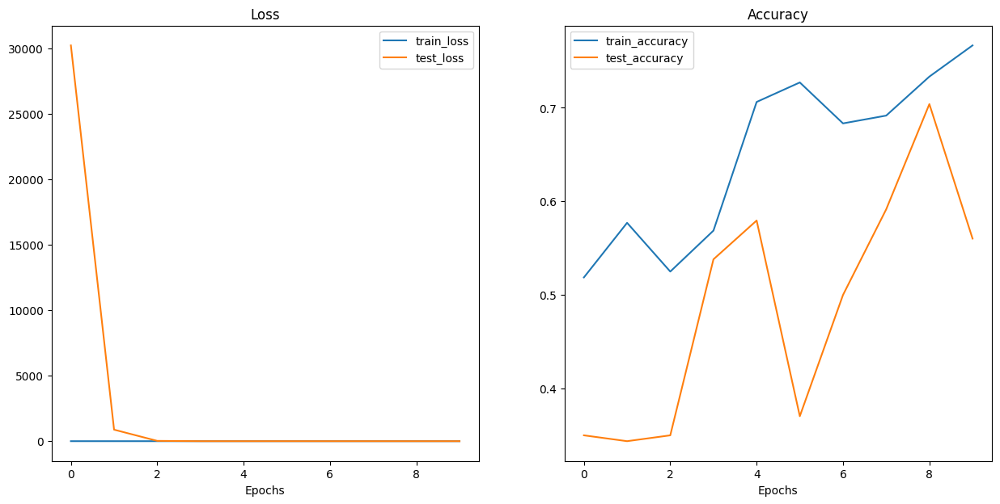

In [57]:
plot_loss_curves(results)